# Aplicaciones Móviles Exitosas

## Preguntas de interés

* ¿Las aplicaciones mejor calificadas (con rating más alto) son más costosas?
* ¿Las aplicaciones con calificación para menores de edad son más costosas?
* ¿Cuál es la tasa de uso de Internet?
* ¿Cuál es el tipo de aplicaciones más utilizadas?
* ¿Los usuarios prefieren aplicaciones que ocupen menos espacio?
* ¿Los usuarios prefieren aplicaciones con funciones más simples o complejas?

## Preguntas e hipótesis de interés sobre el dataset elegido

## Análisis Exploratorio de Datos (EDA)

### Instalaciones e importaciones de librerías y referencias

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as sm
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import scale
import statsmodels.api as sm
import seaborn as sns
sns.set_style("whitegrid")
import requests
import json
from datetime import datetime

In [2]:
!pip install chart_studio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.4/64.4 kB 5.4 MB/s eta 0:00:00


In [3]:
import chart_studio.plotly as py
import plotly.express as px
import plotly.graph_objects as go

In [4]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     / 22.6 MB 22.0 MB/s 0:00:02
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.8/33.8 MB 16.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 83.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 11.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.8/679.8 kB 45.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 22.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 28.9 MB/s eta 0:00:00
  Created wheel for ydata-profiling: filename=ydata_profiling-0.0.dev0-py2.py3-none-any.whl size=345992 sha256=fbff9521531e099a939be29a0ebdf731638bc7687ed879dae41c94d35e1415ad
  Stored in directory: /tmp/pip-ephem-wheel-ca

In [5]:
import pandas_profiling

<ipython-input-5-6a00893fb3e1>:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


### Proceso de importación de datos desde una API

Fuente: División de Estadísticas de Naciones Unidas - CEPALSTAT Statical Databases and Publications

Path: Dashboard CEPALSTAT / Temas transversales / Tecnologías de información y comunicación / Acceso y uso / Uso individual de TIC (America Latina y el Caribe): https://statistics.cepal.org/portal/cepalstat/dashboard.html

In [ ]:
url = 'https://api-cepalstat.cepal.org/cepalstat/api/v1/indicator/3251/data?members=212%2C29170%2C29171%2C29172%2C29173%2C29174%2C29175%2C29176%2C29177%2C29178%2C29179%2C29180%2C29181%2C29182%2C29183%2C29184%2C29185%2C29186%2C29187%2C29188%2C29189%2C29190&lang=es&format=json&in=1&app=dashboard'

In [ ]:
df = requests.get(url)

In [ ]:
print(df) # para chequear la respuesta correcta de la API

<Response [200]>


In [ ]:
df.text # contenido de la respuesta

'{"header":{"name":"uneclac cepalstat api","version":"1.9.13","success":true,"machine":"01","context":"public","code":200,"message":"","timestamp":1680566218},"body":{"metadata":{"indicator_id":3251,"indicator_name":"Porcentaje de personas que utilizan Internet.","theme":"Tecnologías de Información y Comunicación","area":"Uso individual de TIC","note":"","unit":"Porcentaje del total de la población en edad de medición.","data_features":"","definition":"","calculation_methodology":"La edad a partir de la cual se hace la medición del uso de Tecnologías de la Información y Comunicación varia de país en país. En Argentina se incluye la población a partir de los 4 años; en Bahamas a partir de los 3 años; en Belice, Bolivia(Est. Plur de), Chile, Colombia, Costa Rica, República Dominicana, Ecuador y Honduras a partir de los 5 años; en Cuba, México, Perú y Uruguay a partir de los 6 años; en Brasil, El Salvador, Panamá y Paraguay a partir de los 10 años; en Venezuela (Rep. Bol. de) a partir de 

In [ ]:
texto = df.text
json.loads(texto)

{'header': {'name': 'uneclac cepalstat api',
  'version': '1.9.13',
  'success': True,
  'machine': '01',
  'context': 'public',
  'code': 200,
  'message': '',
  'timestamp': 1680566218},
 'body': {'metadata': {'indicator_id': 3251,
   'indicator_name': 'Porcentaje de personas que utilizan Internet.',
   'theme': 'Tecnologías de Información y Comunicación',
   'area': 'Uso individual de TIC',
   'note': '',
   'unit': 'Porcentaje del total de la población en edad de medición.',
   'data_features': '',
   'definition': '',
   'calculation_methodology': 'La edad a partir de la cual se hace la medición del uso de Tecnologías de la Información y Comunicación varia de país en país. En Argentina se incluye la población a partir de los 4 años; en Bahamas a partir de los 3 años; en Belice, Bolivia(Est. Plur de), Chile, Colombia, Costa Rica, República Dominicana, Ecuador y Honduras a partir de los 5 años; en Cuba, México, Perú y Uruguay a partir de los 6 años; en Brasil, El Salvador, Panamá y 

#### Guardo localmente los datos obtenidos de la API con el timestamp

In [ ]:
now = datetime.now()

In [ ]:
print(now)

2023-04-01 22:40:21.866059


In [ ]:
type(now)

datetime.datetime

In [ ]:
file_name = 'CEPALSTAT API Dataset - Datetime: ' + str(now)

In [ ]:
print(file_name)

CEPALSTAT API Dataset - Datetime: 2023-04-01 22:40:21.866059


In [ ]:
with open(file_name, "w") as outfile:
    outfile.write(texto)

#### Trabajo con el dataset obtenido de la **API**

In [ ]:
jsondata=json.loads(texto)

In [ ]:
df2 = pd.DataFrame.from_dict(jsondata)

In [ ]:
df2.head()

,header,body,footer
name,uneclac cepalstat api,NaN,NaN
version,1.9.13,NaN,NaN
success,True,NaN,NaN
machine,01,NaN,NaN
context,public,NaN,NaN


In [ ]:
df2

,header,body,footer
name,uneclac cepalstat api,NaN,NaN
version,1.9.13,NaN,NaN
success,True,NaN,NaN
machine,01,NaN,NaN
context,public,NaN,NaN
code,200,NaN,NaN
message,,NaN,NaN
timestamp,1680566218,NaN,NaN
metadata,NaN,"{'indicator_id': 3251, 'indicator_name': 'Porc...",NaN
data,NaN,"[{'value': '34.7', 'source_id': 8065, 'notes_i...",NaN


In [ ]:
type(df2)

pandas.core.frame.DataFrame

In [ ]:
df2.keys()

Index(['header', 'body', 'footer'], dtype='object')

In [ ]:
df2['body']

name                                                          NaN
version                                                       NaN
success                                                       NaN
machine                                                       NaN
context                                                       NaN
code                                                          NaN
message                                                       NaN
timestamp                                                     NaN
metadata        {'indicator_id': 3251, 'indicator_name': 'Porc...
data            [{'value': '34.7', 'source_id': 8065, 'notes_i...
dimensions      [{'id': 208, 'name': 'País__ESTANDAR', 'order'...
sources         [{'id': 5701, 'description': 'ITU World Teleco...
footnotes                                                      []
credits         [{'id': 0, 'description': '2023-04-01'}, {'id'...
records                                                       NaN
elapsed_ti

Comienzo a explorar los datos obtenidos para identificar valores útiles

##### Análisis de nodo 'data'

In [ ]:
data = df2['body']['data']

In [ ]:
type(data)

list

In [ ]:
data

[{'value': '34.7',
  'source_id': 8065,
  'notes_ids': '',
  'iso3': None,
  'dim_208': 212,
  'dim_29117': 29180},
 {'value': '39.3',
  'source_id': 8065,
  'notes_ids': '',
  'iso3': None,
  'dim_208': 212,
  'dim_29117': 29181},
 {'value': '43.2',
  'source_id': 8065,
  'notes_ids': '',
  'iso3': None,
  'dim_208': 212,
  'dim_29117': 29182},
 {'value': '46.2',
  'source_id': 8065,
  'notes_ids': '',
  'iso3': None,
  'dim_208': 212,
  'dim_29117': 29183},
 {'value': '48.3',
  'source_id': 8065,
  'notes_ids': '',
  'iso3': None,
  'dim_208': 212,
  'dim_29117': 29184},
 {'value': '54.4',
  'source_id': 8065,
  'notes_ids': '',
  'iso3': None,
  'dim_208': 212,
  'dim_29117': 29185},
 {'value': '57.3',
  'source_id': 8065,
  'notes_ids': '',
  'iso3': None,
  'dim_208': 212,
  'dim_29117': 29186},
 {'value': '62.1',
  'source_id': 8065,
  'notes_ids': '',
  'iso3': None,
  'dim_208': 212,
  'dim_29117': 29187},
 {'value': '3.82484807',
  'source_id': 5701,
  'notes_ids': '',
  'iso3

In [ ]:
df_values = pd.DataFrame(data)

In [ ]:
df_values

,value,source_id,notes_ids,iso3,dim_208,dim_29117
0,34.7,8065,,None,212,29180
1,39.3,8065,,None,212,29181
2,43.2,8065,,None,212,29182
3,46.2,8065,,None,212,29183
4,48.3,8065,,None,212,29184
5,54.4,8065,,None,212,29185
6,57.3,8065,,None,212,29186
7,62.1,8065,,None,212,29187
8,3.82484807,5701,,None,212,29170
9,5.53894541,5701,,None,212,29171


En este dataset el campo de interés es 'value' y como es una variable continua no tiene sentido calcular duplicados, también puede verse que no hay valores nulos ni outliers.

In [ ]:
values = df_values['value'].astype(float).sort_values(ascending=True)

In [ ]:
values = values.reset_index(drop=True)

In [ ]:
values

0      3.824848
1      5.538945
2      8.776282
3     11.189240
4     14.327635
5     16.551105
6     20.702445
7     23.680758
8     26.433779
9     30.966892
10    34.700000
11    39.300000
12    43.200000
13    46.200000
14    48.300000
15    54.400000
16    57.300000
17    62.100000
18    65.410824
19    68.684208
20    73.685584
Name: value, dtype: float64

In [ ]:
type(values)

pandas.core.series.Series

En la tabla anterior se pueden ver el incremento de uso de Internet del porcentaje del total de la población en edad de medición.

##### Análisis de nodo 'dimensions'

In [ ]:
dimensiones = df2['body']['dimensions']

In [ ]:
dimensiones

[{'id': 208,
  'name': 'País__ESTANDAR',
  'order': 0,
  'position': 2,
  'members': [{'name': 'América Latina y el Caribe',
    'id': 212,
    'in': 1,
    'order': 410,
    'parent': 208,
    'selected': 1}]},
 {'id': 29117,
  'name': 'Años__ESTANDAR',
  'order': 1,
  'position': 3,
  'members': [{'name': '2000',
    'id': 29170,
    'in': 1,
    'order': 2000,
    'parent': 29117,
    'selected': 0},
   {'name': '2001',
    'id': 29171,
    'in': 1,
    'order': 2001,
    'parent': 29117,
    'selected': 0},
   {'name': '2002',
    'id': 29172,
    'in': 1,
    'order': 2002,
    'parent': 29117,
    'selected': 0},
   {'name': '2003',
    'id': 29173,
    'in': 1,
    'order': 2003,
    'parent': 29117,
    'selected': 0},
   {'name': '2004',
    'id': 29174,
    'in': 1,
    'order': 2004,
    'parent': 29117,
    'selected': 0},
   {'name': '2005',
    'id': 29175,
    'in': 1,
    'order': 2005,
    'parent': 29117,
    'selected': 1},
   {'name': '2006',
    'id': 29176,
    'i

In [ ]:
type(dimensiones)

list

In [ ]:
df_dimensiones = pd.DataFrame(dimensiones)

In [ ]:
df_dimensiones

,id,name,order,position,members
0,208,País__ESTANDAR,0,2,"[{'name': 'América Latina y el Caribe', 'id': ..."
1,29117,Años__ESTANDAR,1,3,"[{'name': '2000', 'id': 29170, 'in': 1, 'order..."


Las dimensiones son 'países' y 'años'

In [ ]:
paises = df2['body']['dimensions'][0]

In [ ]:
paises

{'id': 208,
 'name': 'País__ESTANDAR',
 'order': 0,
 'position': 2,
 'members': [{'name': 'América Latina y el Caribe',
   'id': 212,
   'in': 1,
   'order': 410,
   'parent': 208,
   'selected': 1}]}

Ahora obtendré los valores de los años correspondientes.

In [ ]:
dimensions = df2['body']['dimensions'][1]

In [ ]:
dimensions

{'id': 29117,
 'name': 'Años__ESTANDAR',
 'order': 1,
 'position': 3,
 'members': [{'name': '2000',
   'id': 29170,
   'in': 1,
   'order': 2000,
   'parent': 29117,
   'selected': 0},
  {'name': '2001',
   'id': 29171,
   'in': 1,
   'order': 2001,
   'parent': 29117,
   'selected': 0},
  {'name': '2002',
   'id': 29172,
   'in': 1,
   'order': 2002,
   'parent': 29117,
   'selected': 0},
  {'name': '2003',
   'id': 29173,
   'in': 1,
   'order': 2003,
   'parent': 29117,
   'selected': 0},
  {'name': '2004',
   'id': 29174,
   'in': 1,
   'order': 2004,
   'parent': 29117,
   'selected': 0},
  {'name': '2005',
   'id': 29175,
   'in': 1,
   'order': 2005,
   'parent': 29117,
   'selected': 1},
  {'name': '2006',
   'id': 29176,
   'in': 1,
   'order': 2006,
   'parent': 29117,
   'selected': 1},
  {'name': '2007',
   'id': 29177,
   'in': 1,
   'order': 2007,
   'parent': 29117,
   'selected': 1},
  {'name': '2008',
   'id': 29178,
   'in': 1,
   'order': 2008,
   'parent': 29117,
  

Los 4 primeros registros 'id', 'name', 'order' y 'position' son registros únicos, por lo que el resto del análisis es con el nodo 'members'

In [ ]:
type(dimensions)

dict

In [ ]:
dimensions.keys()

dict_keys(['id', 'name', 'order', 'position', 'members'])

In [ ]:
dimensions['members']

[{'name': '2000',
  'id': 29170,
  'in': 1,
  'order': 2000,
  'parent': 29117,
  'selected': 0},
 {'name': '2001',
  'id': 29171,
  'in': 1,
  'order': 2001,
  'parent': 29117,
  'selected': 0},
 {'name': '2002',
  'id': 29172,
  'in': 1,
  'order': 2002,
  'parent': 29117,
  'selected': 0},
 {'name': '2003',
  'id': 29173,
  'in': 1,
  'order': 2003,
  'parent': 29117,
  'selected': 0},
 {'name': '2004',
  'id': 29174,
  'in': 1,
  'order': 2004,
  'parent': 29117,
  'selected': 0},
 {'name': '2005',
  'id': 29175,
  'in': 1,
  'order': 2005,
  'parent': 29117,
  'selected': 1},
 {'name': '2006',
  'id': 29176,
  'in': 1,
  'order': 2006,
  'parent': 29117,
  'selected': 1},
 {'name': '2007',
  'id': 29177,
  'in': 1,
  'order': 2007,
  'parent': 29117,
  'selected': 1},
 {'name': '2008',
  'id': 29178,
  'in': 1,
  'order': 2008,
  'parent': 29117,
  'selected': 1},
 {'name': '2009',
  'id': 29179,
  'in': 1,
  'order': 2009,
  'parent': 29117,
  'selected': 1},
 {'name': '2010',
  

In [ ]:
df_years = pd.DataFrame(dimensions['members'])

In [ ]:
df_years

,name,id,in,order,parent,selected
0,2000,29170,1,2000,29117,0
1,2001,29171,1,2001,29117,0
2,2002,29172,1,2002,29117,0
3,2003,29173,1,2003,29117,0
4,2004,29174,1,2004,29117,0
5,2005,29175,1,2005,29117,1
6,2006,29176,1,2006,29117,1
7,2007,29177,1,2007,29117,1
8,2008,29178,1,2008,29117,1
9,2009,29179,1,2009,29117,1


In [ ]:
years = df_years['order']
years

0     2000
1     2001
2     2002
3     2003
4     2004
5     2005
6     2006
7     2007
8     2008
9     2009
10    2010
11    2011
12    2012
13    2013
14    2014
15    2015
16    2016
17    2017
18    2018
19    2019
20    2020
Name: order, dtype: int64

##### Concateno los datos de los nodos 'data' y 'dimensions'

In [ ]:
frames = [years, values]

In [ ]:
result = pd.concat(frames,axis=1)

In [ ]:
result

,order,value
0,2000,3.824848
1,2001,5.538945
2,2002,8.776282
3,2003,11.189240
4,2004,14.327635
5,2005,16.551105
6,2006,20.702445
7,2007,23.680758
8,2008,26.433779
9,2009,30.966892


Conclusión: se puede verificar el incremento del porcentaje de la población usando de Internet en America Latina y el Caribe en 20 años.

In [ ]:
px.line(result, x='order', y='value', labels={'order':'Año', 'value': 'Población'}, width=1000, height=600)

### Proceso de importación de datos desde un archivo

In [6]:
# Fuente: https://www.kaggle.com/datasets/ramamet4/app-store-apple-data-set-10k-apps
Archivo_apps = pd.read_csv('AppleStore.csv') # Importo el archivo
Archivo_apps.head() # Verifico que el archivo está bien

,Unnamed: 0,id,track_name,size_bytes,currency,price,rating_count_tot,rating_count_ver,user_rating,user_rating_ver,ver,cont_rating,prime_genre,sup_devices.num,ipadSc_urls.num,lang.num,vpp_lic
0,1,281656475,PAC-MAN Premium,100788224,USD,3.99,21292,26,4.0,4.5,6.3.5,4+,Games,38,5,10,1
1,2,281796108,Evernote - stay organized,158578688,USD,0.00,161065,26,4.0,3.5,8.2.2,4+,Productivity,37,5,23,1
2,3,281940292,"WeatherBug - Local Weather, Radar, Maps, Alerts",100524032,USD,0.00,188583,2822,3.5,4.5,5.0.0,4+,Weather,37,5,3,1
3,4,282614216,"eBay: Best App to Buy, Sell, Save! Online Shop...",128512000,USD,0.00,262241,649,4.0,4.5,5.10.0,12+,Shopping,37,5,9,1
4,5,282935706,Bible,92774400,USD,0.00,985920,5320,4.5,5.0,7.5.1,4+,Reference,37,5,45,1


#### Significado de las columnas

* id: App ID
* track_name: App Name
* size_bytes: Size (in Bytes)
* currency: Currency Type
* price: Price amount
* ratingcounttot: User Rating counts (for all version)
* ratingcountver: User Rating counts (for current version)
* user_rating: Average User Rating value (for all version)
* userratingver: Average User Rating value (for current version)
* ver: Latest version code
* cont_rating: Content Rating
* prime_genre: Primary Genre
* sup_devices.num: Number of supporting devices
* ipadSc_urls.num: Number of screenshots showed for display
* lang.num: Number of supported languages
* vpp_lic: Vpp Device Based Licensing Enabled

#### Revisión  de datos nulos

In [ ]:
Archivo_apps.isnull().sum()

Unnamed: 0          0
id                  0
track_name          0
size_bytes          0
currency            0
price               0
rating_count_tot    0
rating_count_ver    0
user_rating         0
user_rating_ver     0
ver                 0
cont_rating         0
prime_genre         0
sup_devices.num     0
ipadSc_urls.num     0
lang.num            0
vpp_lic             0
dtype: int64

No hay datos nulos

Análisis de los tipos de datos

In [ ]:
Archivo_apps.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7197 entries, 0 to 7196
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        7197 non-null   int64  
 1   id                7197 non-null   int64  
 2   track_name        7197 non-null   object 
 3   size_bytes        7197 non-null   int64  
 4   currency          7197 non-null   object 
 5   price             7197 non-null   float64
 6   rating_count_tot  7197 non-null   int64  
 7   rating_count_ver  7197 non-null   int64  
 8   user_rating       7197 non-null   float64
 9   user_rating_ver   7197 non-null   float64
 10  ver               7197 non-null   object 
 11  cont_rating       7197 non-null   object 
 12  prime_genre       7197 non-null   object 
 13  sup_devices.num   7197 non-null   int64  
 14  ipadSc_urls.num   7197 non-null   int64  
 15  lang.num          7197 non-null   int64  
 16  vpp_lic           7197 non-null   int64  


#### **Feature Selection** para reducir la dimensionalidad del dataset

In [7]:
Archivo_apps.describe()

,Unnamed: 0,id,size_bytes,price,rating_count_tot,rating_count_ver,user_rating,user_rating_ver,sup_devices.num,ipadSc_urls.num,lang.num,vpp_lic
count,7197.000000,7.197000e+03,7.197000e+03,7197.000000,7.197000e+03,7197.000000,7197.000000,7197.000000,7197.000000,7197.000000,7197.000000,7197.000000
mean,4759.069612,8.631310e+08,1.991345e+08,1.726218,1.289291e+04,460.373906,3.526956,3.253578,37.361817,3.707100,5.434903,0.993053
std,3093.625213,2.712368e+08,3.592069e+08,5.833006,7.573941e+04,3920.455183,1.517948,1.809363,3.737715,1.986005,7.919593,0.083066
min,1.000000,2.816565e+08,5.898240e+05,0.000000,0.000000e+00,0.000000,0.000000,0.000000,9.000000,0.000000,0.000000,0.000000
25%,2090.000000,6.000937e+08,4.692275e+07,0.000000,2.800000e+01,1.000000,3.500000,2.500000,37.000000,3.000000,1.000000,1.000000
50%,4380.000000,9.781482e+08,9.715302e+07,0.000000,3.000000e+02,23.000000,4.000000,4.000000,37.000000,5.000000,1.000000,1.000000
75%,7223.000000,1.082310e+09,1.819249e+08,1.990000,2.793000e+03,140.000000,4.500000,4.500000,38.000000,5.000000,8.000000,1.000000
max,11097.000000,1.188376e+09,4.025970e+09,299.990000,2.974676e+06,177050.000000,5.000000,5.000000,47.000000,5.000000,75.000000,1.000000


In [8]:
profile = pandas_profiling.ProfileReport(Archivo_apps)

In [ ]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

De las alertas del informe anterior surge:
*   La variable 'rating_count_tot' está muy relacionada con 'rating_count_ver'.
*   La variable 'rating_count_ver' está muy sesgada.
*   La variable 'vpp_lic' está muy desbalanceada (94%).

Por lo que se podrían eliminar.

In [7]:
Archivo_apps.drop(['rating_count_tot','rating_count_ver','vpp_lic'], axis=1, inplace=True)

También hay dos registros outliers con precios extremadamente altos (299.99 y 249.99) en comparación con el resto.

In [8]:
Archivo_apps.drop(Archivo_apps[Archivo_apps['price'] == 299.99].index, inplace=True)

In [9]:
Archivo_apps.drop(Archivo_apps[Archivo_apps['price'] == 249.99].index, inplace=True)

In [12]:
Archivo_apps.describe(include='object')

,track_name,currency,ver,cont_rating,prime_genre
count,7195,7195,7195,7195,7195
unique,7193,1,1590,4,23
top,VR Roller Coaster,USD,1.0,4+,Games
freq,2,7195,317,4431,3862


*   Las columnas "track_name" y "ver" tienen tantas variantes casi como la cantidad de registros del dataset, por lo que no son muy respresentativas y se podrían eliminar.
*   La columna "currency" tiene un solo valor, por lo que también se puede eliminar.

In [10]:
Archivo_apps.drop(['track_name','currency','ver'], axis=1, inplace=True)

In [ ]:
Archivo_apps.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7195 entries, 0 to 7196
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Unnamed: 0       7195 non-null   int64  
 1   id               7195 non-null   int64  
 2   size_bytes       7195 non-null   int64  
 3   price            7195 non-null   float64
 4   user_rating      7195 non-null   float64
 5   user_rating_ver  7195 non-null   float64
 6   cont_rating      7195 non-null   object 
 7   prime_genre      7195 non-null   object 
 8   sup_devices.num  7195 non-null   int64  
 9   ipadSc_urls.num  7195 non-null   int64  
 10  lang.num         7195 non-null   int64  
dtypes: float64(3), int64(6), object(2)
memory usage: 674.5+ KB


Eimino también otras columnas que evidentemente no aportan al modelo.

In [11]:
Archivo_apps.drop(['Unnamed: 0','id','user_rating_ver'], axis=1, inplace=True)

In [15]:
Archivo_apps.head()

,size_bytes,price,user_rating,cont_rating,prime_genre,sup_devices.num,ipadSc_urls.num,lang.num
0,100788224,3.99,4.0,4+,Games,38,5,10
1,158578688,0.00,4.0,4+,Productivity,37,5,23
2,100524032,0.00,3.5,4+,Weather,37,5,3
3,128512000,0.00,4.0,12+,Shopping,37,5,9
4,92774400,0.00,4.5,4+,Reference,37,5,45


In [12]:
Archivo_apps["cont_rating"] = Archivo_apps["cont_rating"].str.replace('+','') # Los valores de la columna "cont_rating" incluyen el símbolo "+" que es necesario quitar para poder procesar el modelo

<ipython-input-12-f01669e8c03b>:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  Archivo_apps["cont_rating"] = Archivo_apps["cont_rating"].str.replace('+','') # Los valores de la columna "cont_rating" incluyen el símbolo "+" que es necesario quitar para poder procesar el modelo


In [13]:
Archivo_apps["cont_rating"] = pd.to_numeric(Archivo_apps["cont_rating"]) # Transformo la columna "cont_rating" en numérica para poder procesarla en el modelo

In [18]:
Archivo_apps.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7195 entries, 0 to 7196
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   size_bytes       7195 non-null   int64  
 1   price            7195 non-null   float64
 2   user_rating      7195 non-null   float64
 3   cont_rating      7195 non-null   int64  
 4   prime_genre      7195 non-null   object 
 5   sup_devices.num  7195 non-null   int64  
 6   ipadSc_urls.num  7195 non-null   int64  
 7   lang.num         7195 non-null   int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 505.9+ KB


Vuelvo a realizar el reporte de profile para verificar que disminuyeron las alertas del reporte realizado anteriormente.

In [ ]:
profile = pandas_profiling.ProfileReport(Archivo_apps)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Las alertas del reporte disminuyeron de 21 a 4 por lo que mejoró la calidad de los datos analizados.

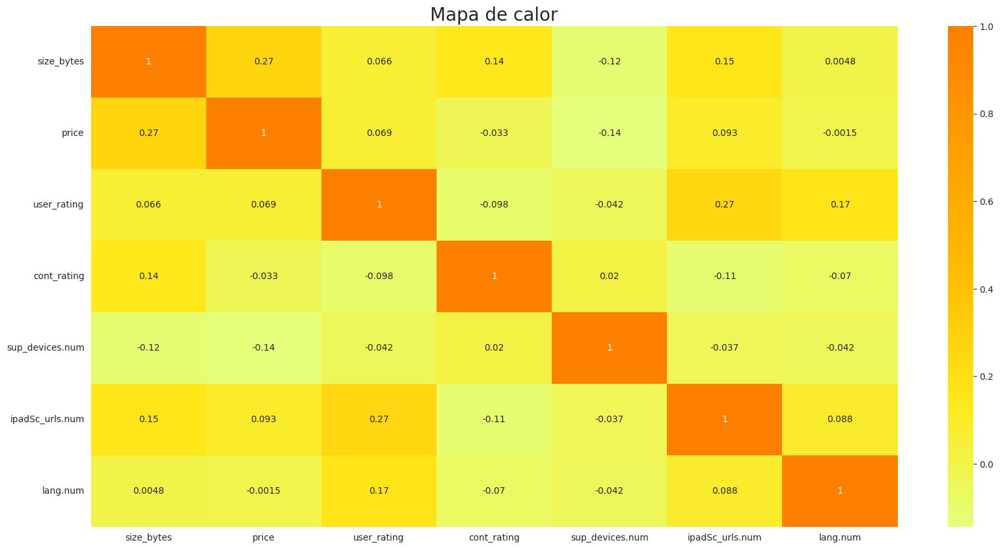

In [ ]:
plt.rcParams['figure.figsize'] = (20,10)
sns.heatmap(Archivo_apps.corr(), annot=True, cmap='Wistia')
plt.title("Mapa de calor", fontsize=20)
plt.show()

No hay mucha correlación entre las variables. La valoración de los usuarios es una de las variables más relevantes y está relacionada con la cantidad de pantallas por aplicación y la cantidad de lenguajes soportados.

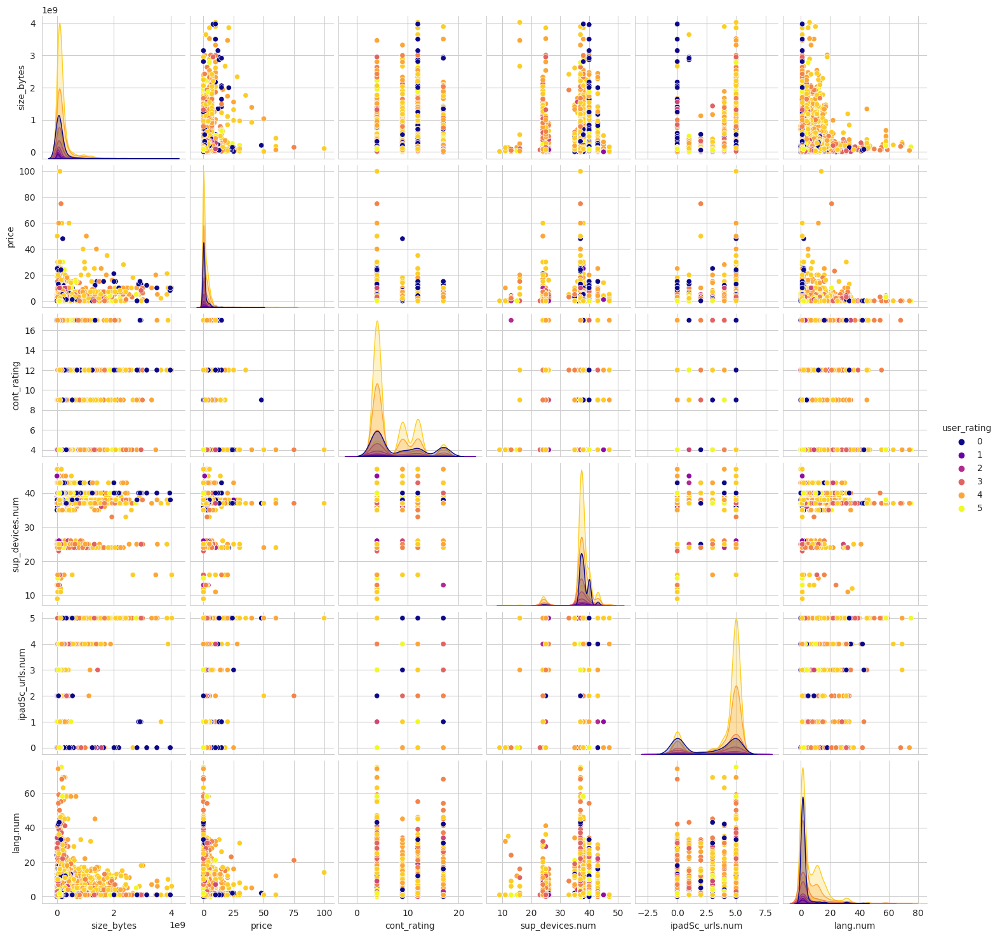

In [ ]:
sns.pairplot(Archivo_apps, hue='user_rating', palette='plasma')

In [ ]:
px.scatter(Archivo_apps, x='ipadSc_urls.num', y ='lang.num', color='user_rating' , size='user_rating')

Las aplicaciones con más pantallas desarrolladas y lenguanjes soportados, tienen mejor valoración de los usuarios.

#### Análisis de duplicados

In [14]:
print(Archivo_apps.shape)
Archivo_apps = Archivo_apps.drop_duplicates()
print(Archivo_apps.shape)

(7195, 8)
(7193, 8)


<Axes: title={'center': 'Gráfico 2 - Popularidad de los géneros '}, ylabel='Cantidad'>

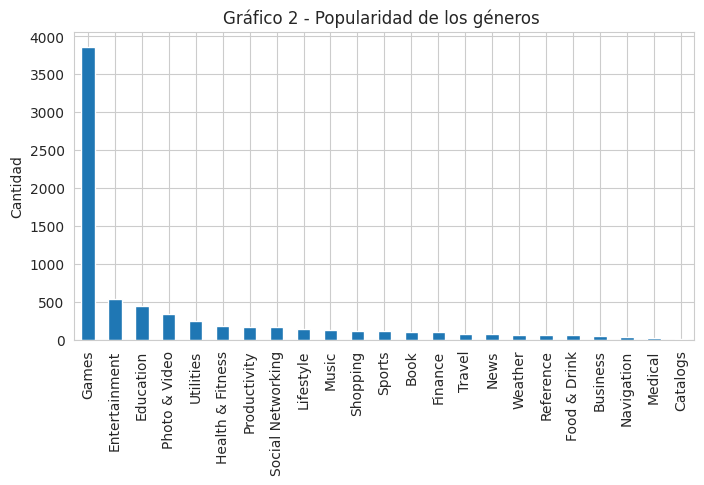

In [21]:
Archivo_apps['prime_genre'].value_counts().plot(kind='bar', figsize=(8,4), ylabel='Cantidad', title='Gráfico 2 - Popularidad de los géneros ')

#### Análisis agrupado

In [18]:
Apps_genero = Archivo_apps.groupby('prime_genre')['price'].mean().sort_values(ascending=False)
Apps_genero

prime_genre
Medical              8.776087
Business             5.116316
Reference            4.836875
Music                4.835435
Productivity         4.330562
Navigation           4.124783
Education            2.826630
Health & Fitness     1.916444
Book                 1.790536
Utilities            1.647621
Weather              1.605417
Food & Drink         1.552381
Photo & Video        1.473295
Games                1.432923
Travel               1.120370
Sports               0.953070
Entertainment        0.889701
Lifestyle            0.885417
Catalogs             0.799000
News                 0.517733
Finance              0.429412
Social Networking    0.339880
Shopping             0.016311
Name: price, dtype: float64

Index(['Medical', 'Business', 'Reference', 'Music', 'Productivity',
       'Navigation', 'Education', 'Health & Fitness', 'Book', 'Utilities',
       'Weather', 'Food & Drink', 'Photo & Video', 'Games', 'Travel', 'Sports',
       'Entertainment', 'Lifestyle', 'Catalogs', 'News', 'Finance',
       'Social Networking', 'Shopping'],
      dtype='object', name='prime_genre')


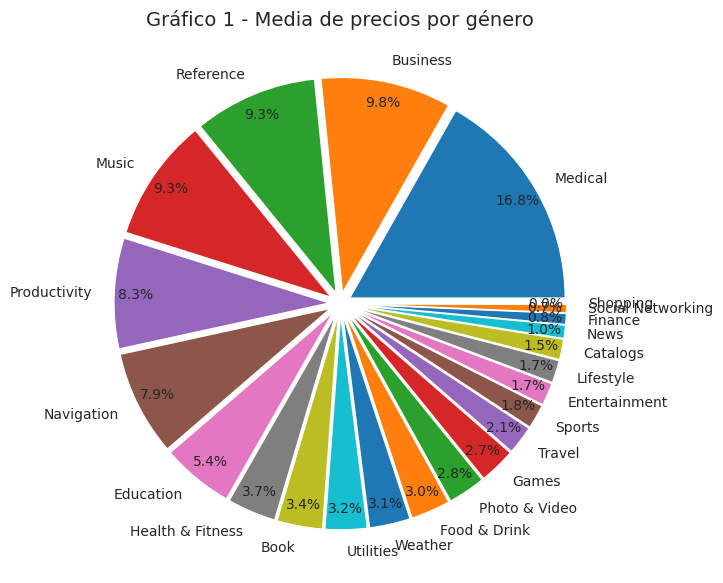

In [20]:
labels = Apps_genero.index
print(labels)
pie, ax = plt.subplots(figsize=[11,7])
fig=plt.pie(x=Apps_genero, autopct="%.1f%%",labels=labels,explode=[0.05]*23,\
            pctdistance=0.9)
plt.title("Gráfico 1 - Media de precios por género", fontsize=14);


#### Entrenamiento del modelo **PCA** con escalado de los datos

In [ ]:
pca_pipe = make_pipeline(StandardScaler(), PCA()) # estandariza, aplica PCA y lo mete en la tubería make_pipeline
pca_pipe.fit(Archivo_apps)

Pipeline(steps=[('standardscaler', StandardScaler()), ('pca', PCA())])

In [ ]:
modelo_pca = pca_pipe.named_steps['pca'] # Se extrae el modelo entrenado del pipeline

In [ ]:
# Porcentaje de varianza explicada por cada componente
print('Porcentaje de varianza explicada por cada componente')
print(modelo_pca.explained_variance_ratio_)

Porcentaje de varianza explicada por cada componente
[0.15368048 0.13441116 0.11861279 0.09954977 0.09693346 0.09555076
 0.08445097 0.07837637 0.07340104 0.06503321]


*   La 1° componente nos explica el 15% de la variabilidad de los datos.
*   La 2° componente nos explica el 13% de la variabilidad de los datos.

Estas son las componentes que más variabilidad aportan.

In [ ]:
modelo_pca.explained_variance_ratio_.cumsum()

array([0.15368048, 0.28809163, 0.40670443, 0.50625419, 0.60318765,
       0.69873841, 0.78318938, 0.86156575, 0.93496679, 1.        ])

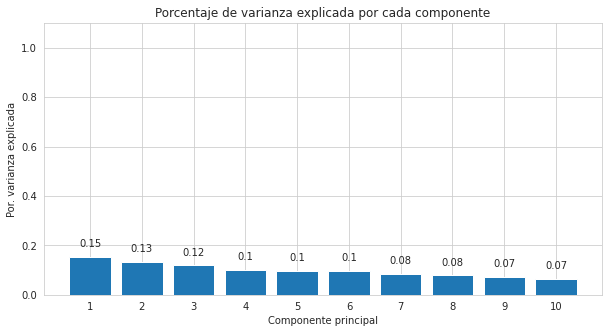

In [ ]:
import seaborn as sns;sns.set_style("whitegrid")
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))
ax.bar(x= np.arange(modelo_pca.n_components_) + 1,height = modelo_pca.explained_variance_ratio_) # varianza que aporta cada componente
for x, y in zip(np.arange(len(Archivo_apps.columns)) + 1, modelo_pca.explained_variance_ratio_):
   label = round(y, 2)
   ax.annotate(label,(x,y),textcoords="offset points",xytext=(0,10),ha='center') # pone los valores sobre las columnas del gráfico

ax.set_xticks(np.arange(modelo_pca.n_components_) + 1);ax.set_ylim(0, 1.1)
ax.set_title('Porcentaje de varianza explicada por cada componente')
ax.set_xlabel('Componente principal')
ax.set_ylabel('Por. varianza explicada');

Las varianzas de las variables no difieren mucho entre ellas.

#### **Hipótesis 1**: Las aplicaciones mejor calificadas por los usarios (con rating más alto) tienden a costar más.

In [ ]:
rating_mean = Archivo_apps.groupby("user_rating", as_index=False).mean("price")
rating_mean

,user_rating,Unnamed: 0,id,size_bytes,price,rating_count_tot,rating_count_ver,user_rating_ver,cont_rating,sup_devices.num,ipadSc_urls.num,lang.num,vpp_lic
0,0.0,6465.852530,1.007350e+09,1.545463e+08,1.080129,0.000000,0.000000,0.000000,8.376749,38.052745,2.582347,2.362756,0.979548
1,1.0,6109.431818,9.665681e+08,6.311240e+07,1.926591,29.568182,17.204545,0.977273,6.250000,38.045455,2.477273,2.727273,1.000000
2,1.5,5802.428571,9.566616e+08,6.397966e+07,1.208929,203.500000,22.482143,1.250000,6.767857,37.803571,2.196429,2.232143,0.982143
3,2.0,5457.301887,9.042506e+08,8.878507e+07,1.155755,2907.235849,62.075472,1.985849,7.018868,37.264151,2.915094,2.915094,0.990566
4,2.5,4587.637755,8.457130e+08,1.238298e+08,1.103214,5419.933673,50.530612,2.293367,6.994898,36.413265,2.918367,4.545918,0.984694
5,3.0,4791.159269,8.418089e+08,1.694169e+08,1.288068,7487.130548,234.926893,2.647520,6.832898,36.668407,3.138381,4.057441,0.986945
6,3.5,4305.857550,8.087262e+08,2.044705e+08,1.757436,15503.266382,138.287749,3.158120,6.910256,36.797721,3.658120,5.777778,0.992877
7,4.0,4456.072571,8.332178e+08,2.383879e+08,2.209865,7836.835793,301.084256,3.736777,6.891759,37.263838,4.031365,5.911439,0.995080
8,4.5,4278.417199,8.330329e+08,2.163224e+08,1.802110,22029.743522,803.062336,4.199024,6.848667,37.434848,4.136688,6.741645,0.998122
9,5.0,5439.268293,9.249921e+08,1.574089e+08,1.645589,12699.829268,974.873984,4.378049,7.288618,37.617886,3.713415,4.674797,0.993902


In [ ]:
type(rating_mean)

pandas.core.frame.DataFrame

##### Análisis de outliers

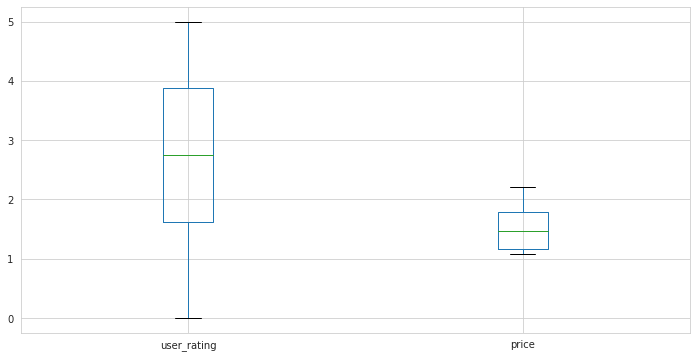

In [ ]:
plt.figure(figsize=(12,6))
boxplot = rating_mean.boxplot(column=['user_rating', 'price']) 

Se puede ver que no hay outliers en las variables 'user_rating' y 'price' de este análisis de la hipótesis 1.

##### Análisis gráfico

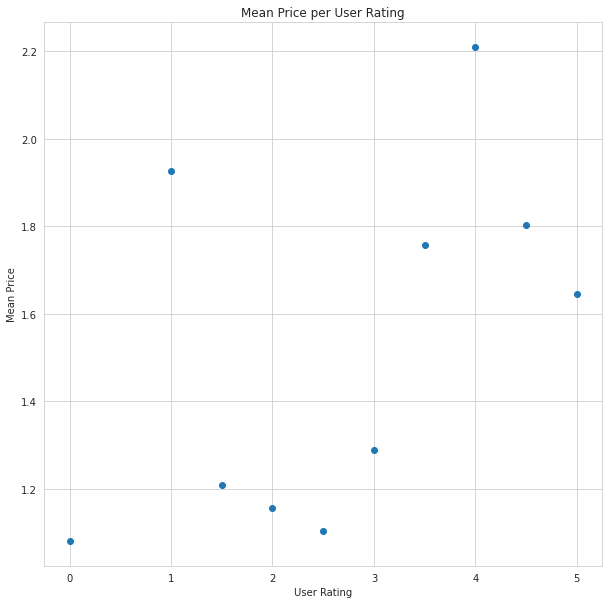

In [ ]:
plt.subplots(figsize=(10, 10))
x = rating_mean.user_rating
y = rating_mean.price

plt.scatter(rating_mean.user_rating, rating_mean.price)
plt.xlabel('User Rating')
plt.ylabel('Mean Price')
plt.title('Mean Price per User Rating')
plt.show()

In [ ]:
model1 = 'user_rating~price'
lm1 = sm.ols(formula=model1, data = rating_mean).fit()

##### Cálculo de métricas para validar el modelo

In [ ]:
print(lm1.summary())

                            OLS Regression Results                            
Dep. Variable:            user_rating   R-squared:                       0.274
Model:                            OLS   Adj. R-squared:                  0.183
Method:                 Least Squares   F-statistic:                     3.018
Date:                Thu, 12 Jan 2023   Prob (F-statistic):              0.121
Time:                        00:17:29   Log-Likelihood:                -16.775
No. Observations:                  10   AIC:                             37.55
Df Residuals:                       8   BIC:                             38.16
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.4777      1.886     -0.253      0.8

/usr/local/lib/python3.8/dist-packages/scipy/stats/stats.py:1541: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


###### Conclusiones con base en los resultados obtenidos:

Según el modelo numérico, no es buena la relación de las variables elegidas: la media del precio de las aplicaciones agrupada por la calificación de los usuarios.
*   R-squared bajo (muy lejos del 1 esperado): 0.274
*   Adj. R-squared bajo (muy lejos del 1 esperado): 0.183
*   La pendiente de la variable "price" (media del precio) pasa por el cero (-0.686 y 4.873) es malo.

El resultado del modelo demuestra que las aplicaciones mejor calificadas por los usarios (con rating más alto) no tienden a costar más. Como parecía  observarse en el gráfico correspondiente, en los cuadrantes izquierdo inferior y derecho superior.

#### **Hipótesis 2**: Las aplicaciones con calificación para menor edad son de mayor precio. 

In [ ]:
cont_rating = Archivo_apps.groupby("cont_rating", as_index=False).mean("price")
cont_rating.sort_values(by=['price'])

,cont_rating,Unnamed: 0,id,size_bytes,price,rating_count_tot,rating_count_ver,user_rating,user_rating_ver,sup_devices.num,ipadSc_urls.num,lang.num,vpp_lic
3,17,4420.734727,8.341879e+08,1.774134e+08,0.981109,9743.901929,440.191318,2.760450,2.153537,37.090032,2.495177,4.839228,0.993569
2,12,4845.197403,8.719939e+08,3.111782e+08,1.566667,17539.424242,582.045887,3.566667,3.267100,37.896104,3.780087,4.632900,0.980087
0,4,4644.489059,8.490603e+08,1.408221e+08,1.777201,11939.485901,466.958268,3.570156,3.314798,37.278818,3.747124,5.949470,0.996391
1,9,5386.123607,9.341961e+08,3.436112e+08,2.153506,13722.158055,301.137791,3.769504,3.656028,37.280648,4.205674,4.437690,0.992908


##### Análisis gráfico

<Axes: xlabel='cont_rating', ylabel='price'>

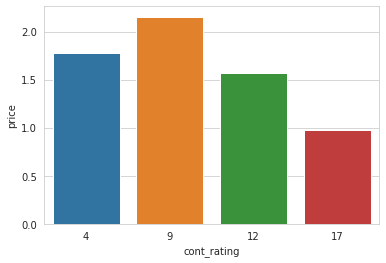

In [ ]:
sns.barplot(data=cont_rating.sort_values(by=['price']), x="cont_rating", y="price")

In [ ]:
cont_rating.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4 entries, 0 to 3
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   cont_rating       4 non-null      object 
 1   Unnamed: 0        4 non-null      float64
 2   id                4 non-null      float64
 3   size_bytes        4 non-null      float64
 4   price             4 non-null      float64
 5   rating_count_tot  4 non-null      float64
 6   rating_count_ver  4 non-null      float64
 7   user_rating       4 non-null      float64
 8   user_rating_ver   4 non-null      float64
 9   sup_devices.num   4 non-null      float64
 10  ipadSc_urls.num   4 non-null      float64
 11  lang.num          4 non-null      float64
 12  vpp_lic           4 non-null      float64
dtypes: float64(12), object(1)
memory usage: 544.0+ bytes


In [ ]:
cont_rating["cont_rating"] = cont_rating["cont_rating"].str.replace('+','') # Los valores de la columna "cont_rating" incluyen el símbolo "+" que es necesario quitar para poder procesar el modelo

<ipython-input-50-c91e92f1d785>:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  cont_rating["cont_rating"] = cont_rating["cont_rating"].str.replace('+','') # Los valores de la columna "cont_rating" incluyen el símbolo "+" que es necesario quitar para poder procesar el modelo


In [ ]:
cont_rating["cont_rating"] = pd.to_numeric(cont_rating["cont_rating"]) # Transformo la columna "cont_rating" en numérica para poder procesarla en el modelo

In [ ]:
cont_rating

,cont_rating,Unnamed: 0,id,size_bytes,price,rating_count_tot,rating_count_ver,user_rating,user_rating_ver,sup_devices.num,ipadSc_urls.num,lang.num,vpp_lic
0,12,4845.197403,8.719939e+08,3.111782e+08,1.566667,17539.424242,582.045887,3.566667,3.267100,37.896104,3.780087,4.632900,0.980087
1,17,4420.734727,8.341879e+08,1.774134e+08,0.981109,9743.901929,440.191318,2.760450,2.153537,37.090032,2.495177,4.839228,0.993569
2,4,4644.489059,8.490603e+08,1.408221e+08,1.777201,11939.485901,466.958268,3.570156,3.314798,37.278818,3.747124,5.949470,0.996391
3,9,5386.123607,9.341961e+08,3.436112e+08,2.153506,13722.158055,301.137791,3.769504,3.656028,37.280648,4.205674,4.437690,0.992908


In [ ]:
cont_rating.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4 entries, 0 to 3
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   cont_rating       4 non-null      int64  
 1   Unnamed: 0        4 non-null      float64
 2   id                4 non-null      float64
 3   size_bytes        4 non-null      float64
 4   price             4 non-null      float64
 5   rating_count_tot  4 non-null      float64
 6   rating_count_ver  4 non-null      float64
 7   user_rating       4 non-null      float64
 8   user_rating_ver   4 non-null      float64
 9   sup_devices.num   4 non-null      float64
 10  ipadSc_urls.num   4 non-null      float64
 11  lang.num          4 non-null      float64
 12  vpp_lic           4 non-null      float64
dtypes: float64(12), int64(1)
memory usage: 544.0 bytes


##### Análisis de outliers

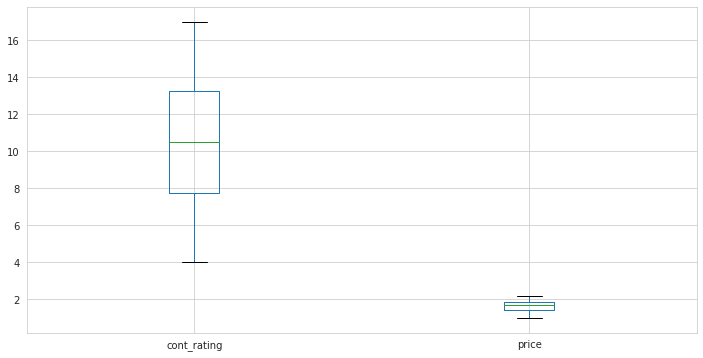

In [ ]:
plt.figure(figsize=(12,6))
boxplot = cont_rating.boxplot(column=['cont_rating', 'price']) 

Se puede ver que no hay outliers en las variables 'cont_rating' y 'price' de este análisis de la hipótesis 1.

##### Cálculo de métricas para validar el modelo

In [ ]:
model2 = 'cont_rating~price'
lm2 = sm.ols(formula=model2, data = cont_rating).fit()

In [ ]:
print(lm2.summary())

                            OLS Regression Results                            
Dep. Variable:            user_rating   R-squared:                       0.898
Model:                            OLS   Adj. R-squared:                  0.847
Method:                 Least Squares   F-statistic:                     17.61
Date:                Thu, 12 Jan 2023   Prob (F-statistic):             0.0524
Time:                        00:45:51   Log-Likelihood:                 2.6806
No. Observations:                   4   AIC:                            -1.361
Df Residuals:                       2   BIC:                            -2.589
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.0146      0.345      5.833      0.0

/usr/local/lib/python3.8/dist-packages/statsmodels/stats/stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 4 samples were given.
  warn("omni_normtest is not valid with less than 8 observations; %i "


###### Conclusiones con base en los resultados obtenidos:

Hay relación entre la calificación de contenido de las aplicaciones y el precio.
*   R-squared (cerca del 1 esperado): 0.898
*   Adj. R-squared (cerca del 1 esperado): 0.847

El resultado del modelo demuestra que las aplicaciones con contenidos calificados para menor edad tienen mayor precio. 

# Conclusiones finales

## Insights

* No hay una relación directa entre el precio de una aplicación y su calificación de los usuarios.
* En general las aplicaciones que generan contenidos para menores de edad pueden cobrar precios más altos.
* En América Latina y el Caribe, todos los años se incrementa más del 10% la población que utiliza Internet.
* Las aplicaciones con más cantidad de funciones por pantallas son las mejor calificadas por los usuarios.
* Las aplicaciones mejor calificadas por los usuarios son las más pequeñas y ocupan menos espacio (bytes) en los dispositivos.
* Los juegos son más del 50% de las aplicaciones utilizadas.

## Recomendaciones con base en insights observados

> Se recomienda desarrollar juegos con contenidos aptos con la menor restricción de edad posible.

> De acuerdo al modelo analizado, los usuarios están dispuestos a pagar más cuando el contenido es calificado para menor edad. Por lo tanto desarrollar juegos con contenidos aptos para más público deberían ser más redituables financieramente.
> 
> Estos tipos de desarrollos además de contribuir con las ganancias financieras, al tener pocas restricciones por edad, también contribuyen con el conocimiento y popularidad de los juegos, para hacer más conocida la marca en el mercado.

